In [1]:
import os
import numpy as np
import pandas as pd
import scipy
import anndata
import scanpy as sc
import pybiomart
import scvi
import torch
import random
import seaborn as sns

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def PlotUMAP(adata, markers, layer='log2_counts_scvi', size=2, vmin='p0', vmax='p99'):
    for i in range(len(markers)):
        sc.pl.umap(adata,
                  color=markers[i],
                  layer=layer,
                  size=size,
                  cmap=sns.blend_palette(['lightgray', sns.xkcd_rgb['red orange']], as_cmap=True),
                   vmin=vmin, vmax=vmax)

In [3]:
cwd = os.getcwd()
adata = sc.read_h5ad(cwd+'/outs/231226_trevino_rna_scvi.h5ad')
adata

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 57868 × 19215
    obs: 'Cell.ID', 'Sample.ID', 'Age', 'Tissue.ID', 'Sample.Type', 'Assay', 'Batch', 'seurat_clusters', 'RNA.Counts', 'RNA.Features', 'Percent.MT', 'Percent.Ribo', 'Cell.Barcode', 'DF_pANN', 'DF_classification', 'DF_pANN_quantile', 'Spliced.Counts', 'Spliced.Features', 'Unspliced.Counts', 'Unspliced.Features', 'Ambiguous.Counts', 'Ambiguous.Features', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_scvi'
    var: 'n_cells'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden', 'leiden_scvi_colors', 'neighbors_scvi', 'umap'
    obsm: 'X_scvi', 'X_umap'
    layers: 'counts', 'counts_scvi'
    obsp: 'neighbors_scvi_connectivities', 'neighbors_scvi_distances'

In [4]:
adata.layers['log2_counts'] = sc.pp.log1p(adata.layers['counts'].copy(), base=2)
adata.layers['log2_counts_scvi'] = sc.pp.log1p(adata.layers['counts_scvi'].copy(), base=2)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


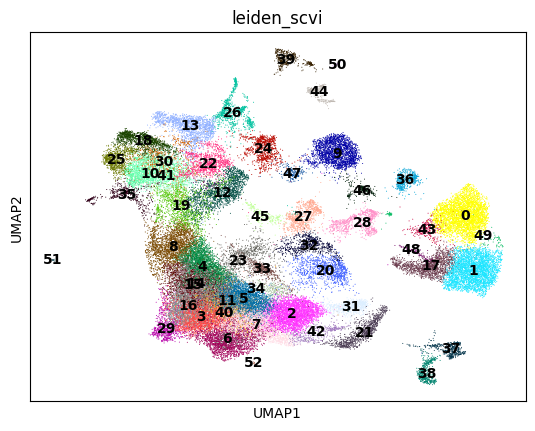

In [5]:
sc.pl.umap(adata, color=['leiden_scvi'], legend_loc='on data')

In [6]:
adata.obs

,Cell.ID,Sample.ID,Age,Tissue.ID,Sample.Type,Assay,Batch,seurat_clusters,RNA.Counts,RNA.Features,...,Spliced.Counts,Spliced.Features,Unspliced.Counts,Unspliced.Features,Ambiguous.Counts,Ambiguous.Features,n_genes,_scvi_batch,_scvi_labels,leiden_scvi
hft_w20_p3_r1_AAACCCAAGCTGCGAA,hft_w20_p3_r1_AAACCCAAGCTGCGAA,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c16,1397,677,...,1063,544,67,54,94,69,672,2,0,38
hft_w20_p3_r1_AAACCCAAGGTAGTAT,hft_w20_p3_r1_AAACCCAAGGTAGTAT,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c11,14338,4301,...,10339,3514,5437,2526,1431,669,4247,2,0,13
hft_w20_p3_r1_AAACCCACAACTCCAA,hft_w20_p3_r1_AAACCCACAACTCCAA,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c17,9260,3481,...,6494,2701,6860,2515,1095,669,3451,2,0,26
hft_w20_p3_r1_AAACCCACATAGTCAC,hft_w20_p3_r1_AAACCCACATAGTCAC,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c0,4025,1969,...,2655,1475,5875,2058,634,377,1939,2,0,6
hft_w20_p3_r1_AAACCCAGTACAGGTG,hft_w20_p3_r1_AAACCCAGTACAGGTG,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c4,7131,2930,...,5008,2228,6026,2106,909,556,2903,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hft_w16_p7_r2_TTTGTTGCAGCACCCA,hft_w16_p7_r2_TTTGTTGCAGCACCCA,hft_w16_p7_r2,pcw16,HFT7,HFT,RNA NG,b2020_03,c6,8532,3497,...,6226,2730,4194,2059,973,612,3459,1,0,41
hft_w16_p7_r2_TTTGTTGCAGGCTACC,hft_w16_p7_r2_TTTGTTGCAGGCTACC,hft_w16_p7_r2,pcw16,HFT7,HFT,RNA NG,b2020_03,c2,6689,2393,...,4757,1877,3039,1362,677,396,2380,1,0,8
hft_w16_p7_r2_TTTGTTGGTCGCTTAA,hft_w16_p7_r2_TTTGTTGGTCGCTTAA,hft_w16_p7_r2,pcw16,HFT7,HFT,RNA NG,b2020_03,c2,3865,1799,...,2808,1409,1436,832,431,273,1784,1,0,15
hft_w16_p7_r2_TTTGTTGGTCGTACAT,hft_w16_p7_r2_TTTGTTGGTCGTACAT,hft_w16_p7_r2,pcw16,HFT7,HFT,RNA NG,b2020_03,c2,5293,2365,...,3660,1760,6166,2211,672,416,2348,1,0,5


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


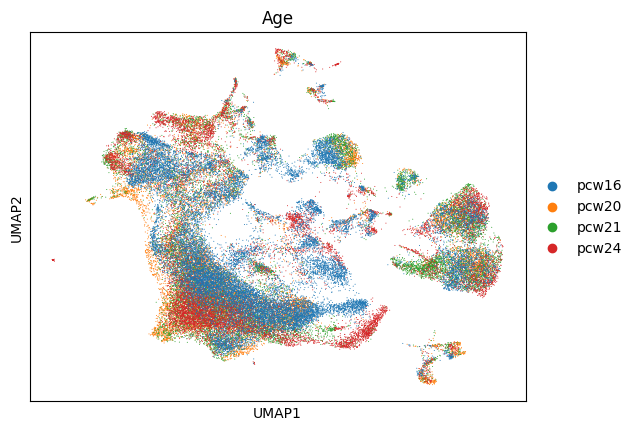

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


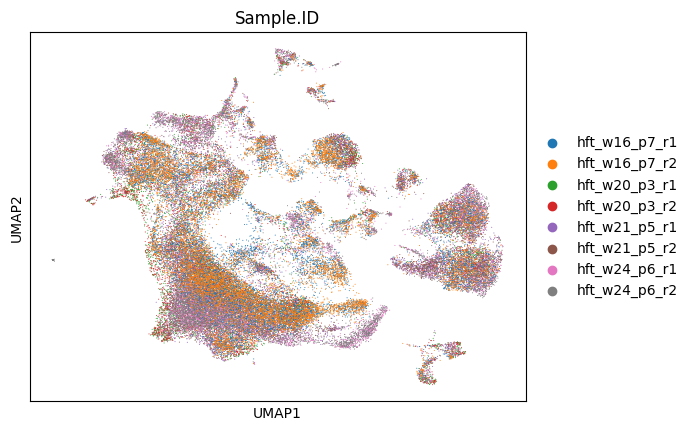

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


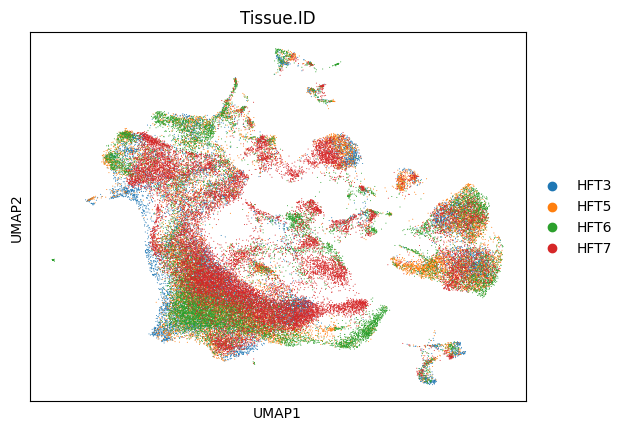

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


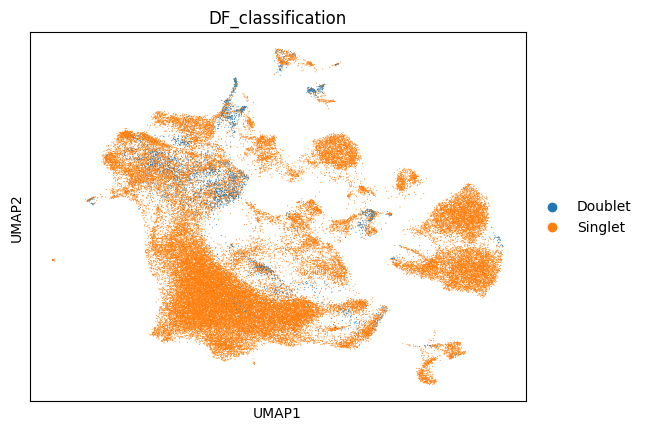

In [7]:
sc.pl.umap(adata, color=['Age'])
sc.pl.umap(adata, color=['Sample.ID'])
sc.pl.umap(adata, color=['Tissue.ID'])
sc.pl.umap(adata, color=['DF_classification'])

In [8]:
adata.var_names_make_unique()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Paramete

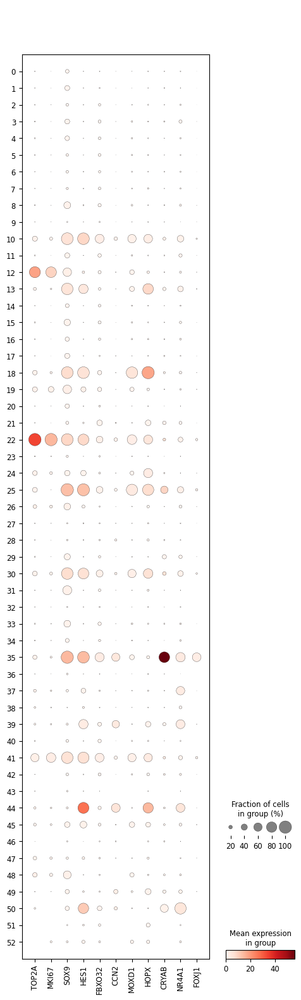

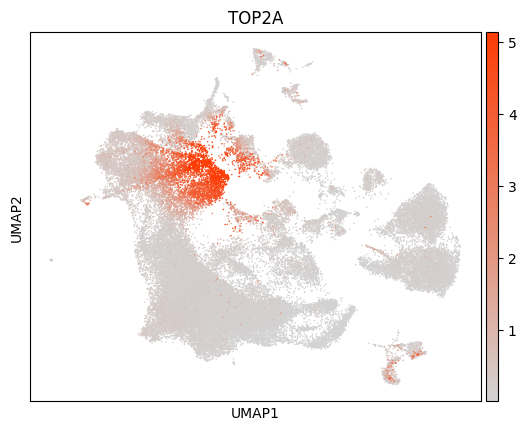

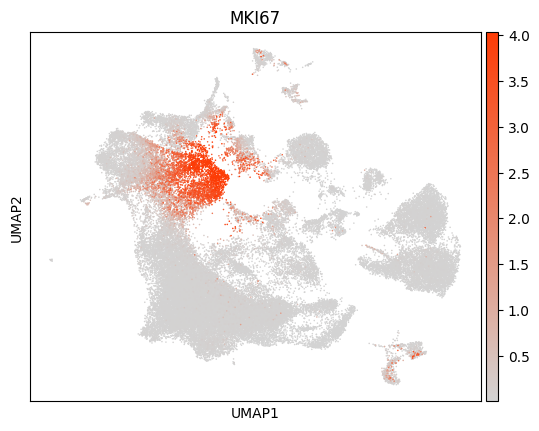

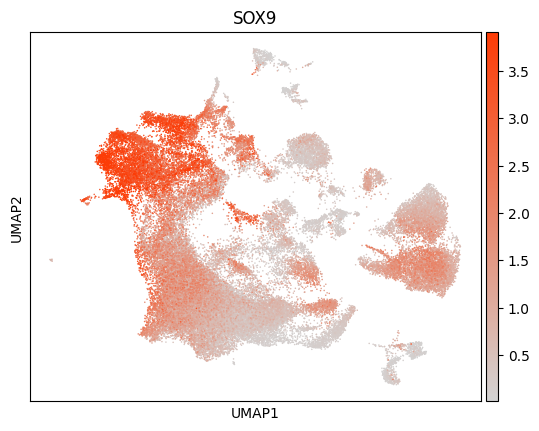

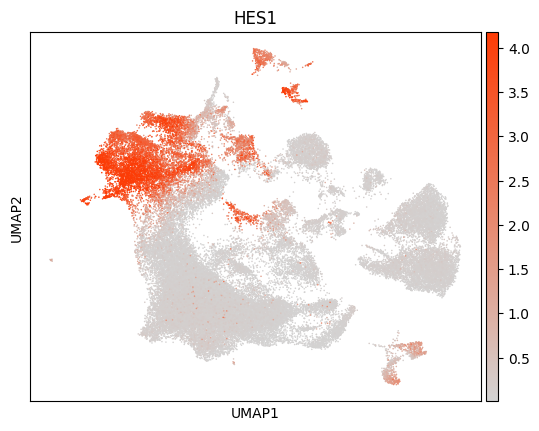

...

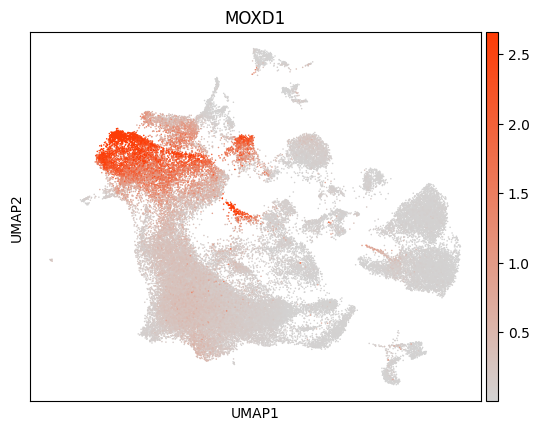

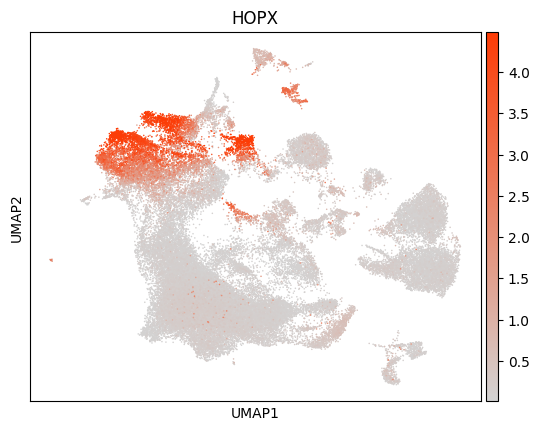

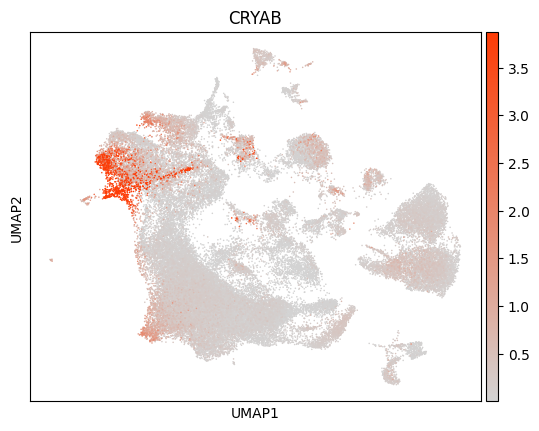

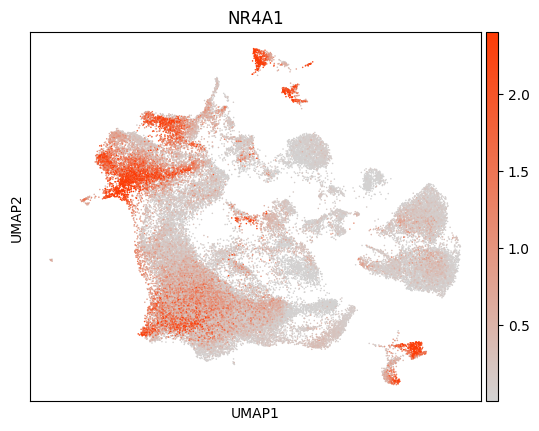

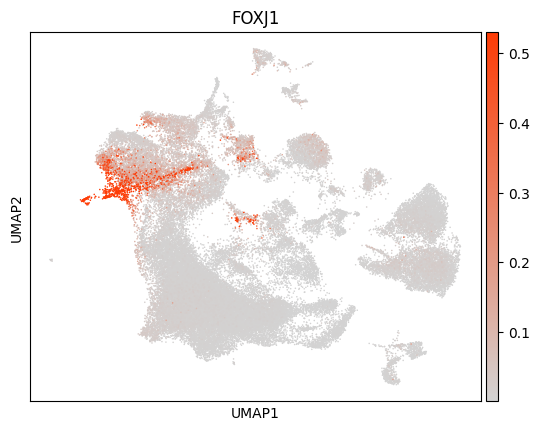

In [9]:
# cycling cells (Cycling: TOP2A, MKI67)

# radial glia (RG: SOX9, HES1)
## includes ventricular radial glia (vRG: FBXO32, CCN2/CTGF) 
## includes outer radial glia (oRG: MOXD1, HOPX)
## these were separated according to time (early RG, PCW16: NPY, FGFR3; late RG, PCW20–24: CD9, GPX3)
## includes truncated RG (tRG) and ependymal cells (tRG: CRYAB, NR4A1, FOXJ1)

markers = ['TOP2A','MKI67',
           'SOX9','HES1',
           'FBXO32','CCN2',
           'MOXD1','HOPX',
           'CRYAB','NR4A1','FOXJ1']
sc.pl.dotplot(adata, markers, groupby='leiden_scvi')
PlotUMAP(adata, markers, layer='log2_counts_scvi', size=5)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Paramete

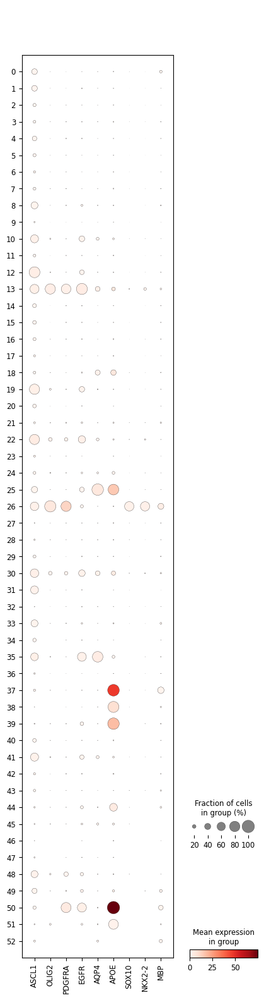

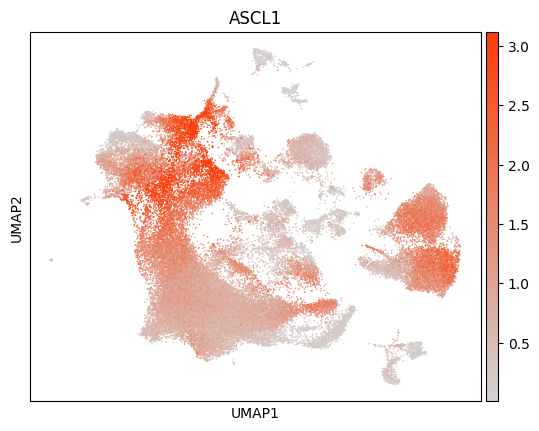

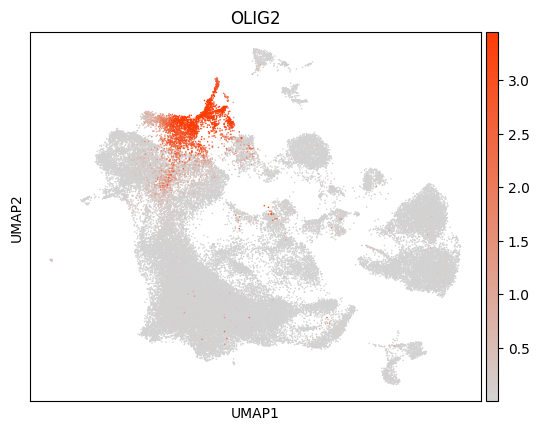

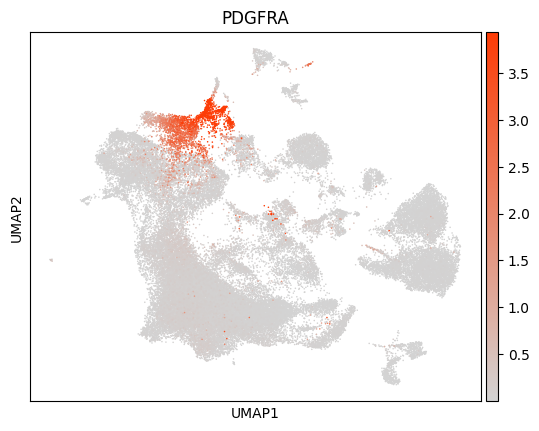

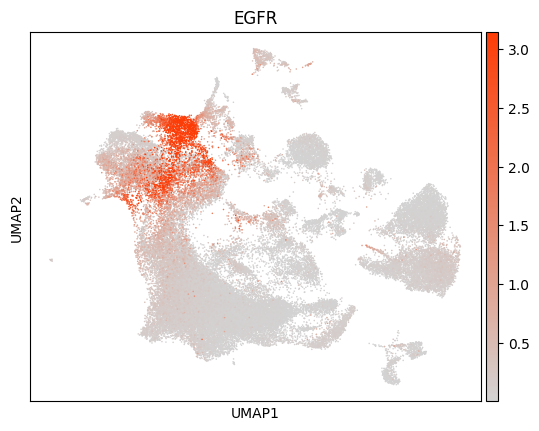

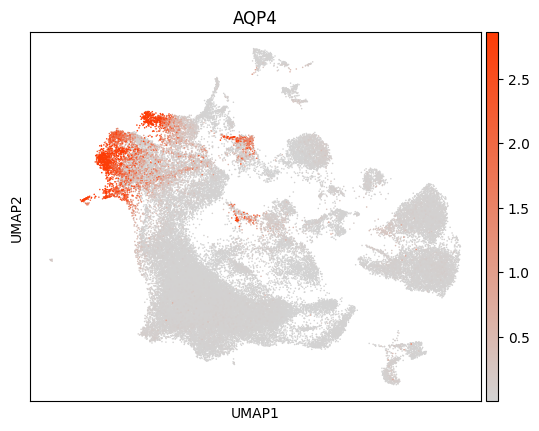

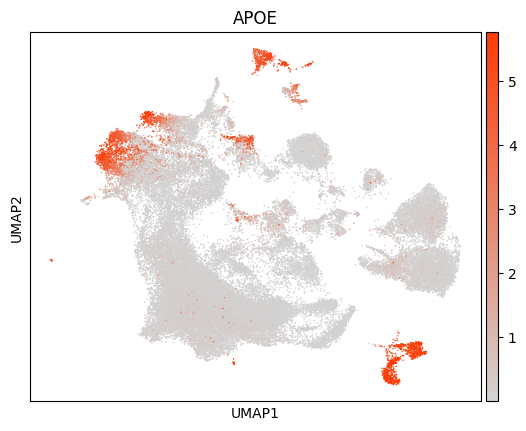

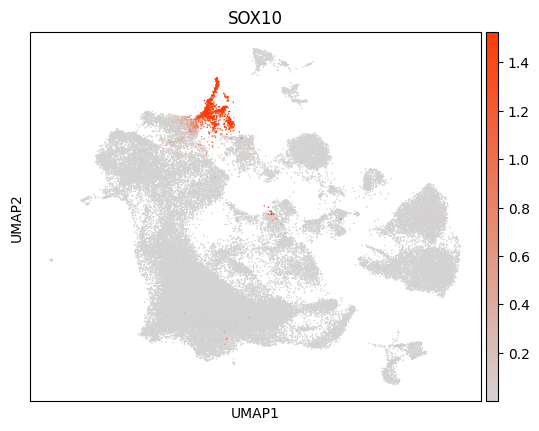

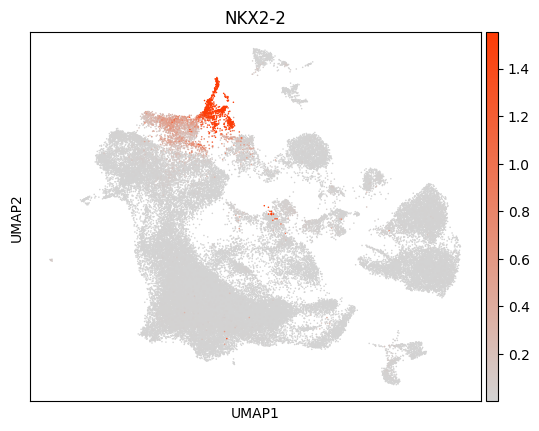

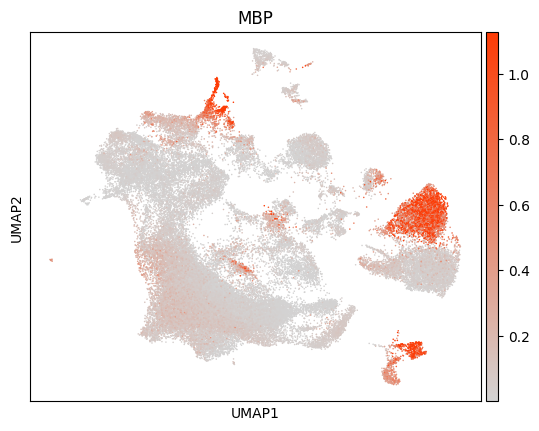

In [10]:
# A cluster of multipotent glial progenitor cells (mGPC) expressed genes associated with both RGs and oligodendrocyte precursors (mGPC: ASCL1, OLIG2, PDGFRA, EGFR).
# This cluster was different from the OPC/Oligo cluster that expressed SOX10, NKX2.2, and MBP.
# Genes associated with astrocyte identity (AQP4, APOE) were observed in the mGPC cluster as well as in the late RG cluster.
# oligodendrocyte progenitor cell and oligodendrocyte (OPC/Oligo: SOX10, NKX2-2/NKX2.2, MBP)

markers = ['ASCL1','OLIG2','PDGFRA','EGFR','AQP4','APOE',
           'SOX10','NKX2-2','MBP']
sc.pl.dotplot(adata, markers, groupby='leiden_scvi')
PlotUMAP(adata, markers, layer='log2_counts_scvi', size=5)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Paramete

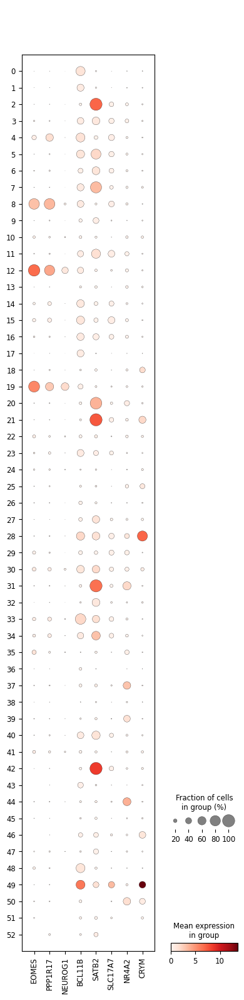

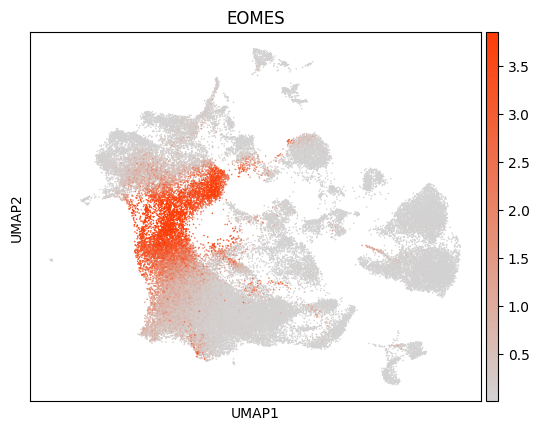

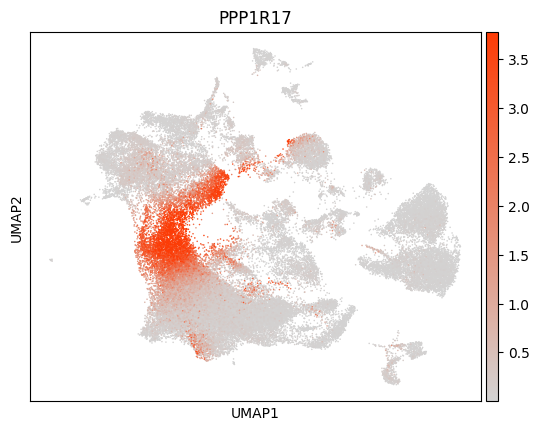

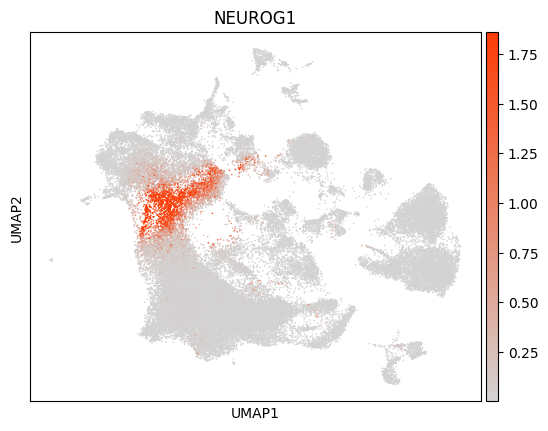

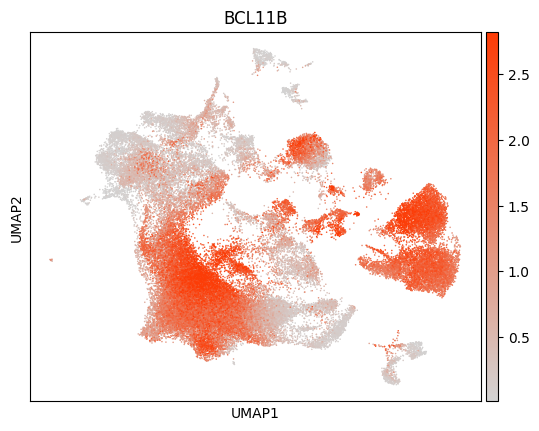

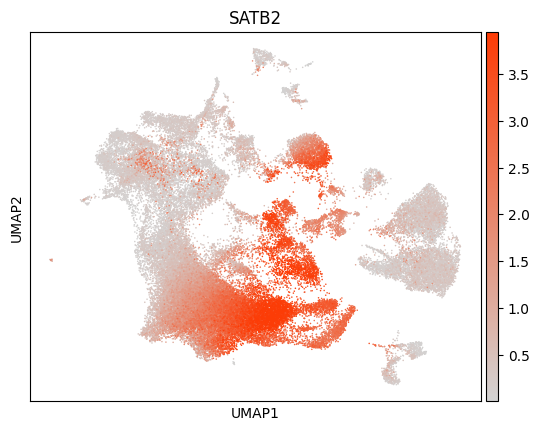

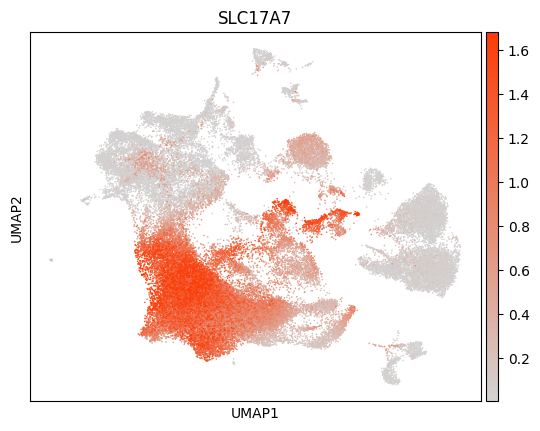

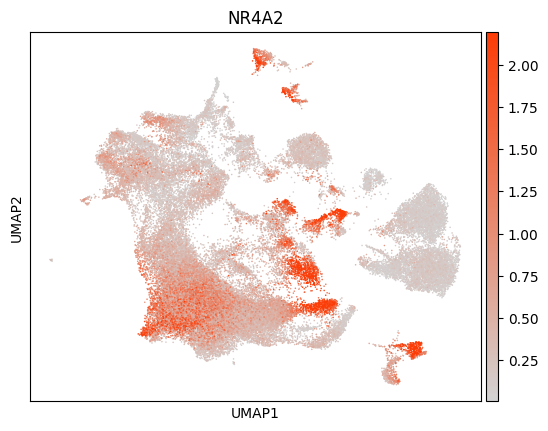

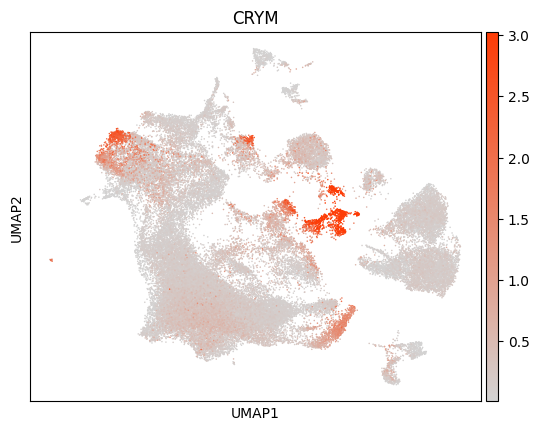

In [11]:
# intermediate progenitor cell (IPC: EOMES, PPP1R17, NEUROG1)
# glutamatergic neuron (GluN: BCL11B/CTIP2, SATB2, SLC17A7/VGLUT1)
## includes callosal projection neurons (CPN: SATB2 and not CTIP2)
## GluNs that are not CPNs are subcerebral projection neurons (SCPN)
## includes cells expressing subplate markers (SP: NR4A2, CRYM)

markers = ['EOMES','PPP1R17','NEUROG1',
           'BCL11B','SATB2','SLC17A7',
           'NR4A2','CRYM']
sc.pl.dotplot(adata, markers, groupby='leiden_scvi')
PlotUMAP(adata, markers, layer='log2_counts_scvi', size=5)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Paramete

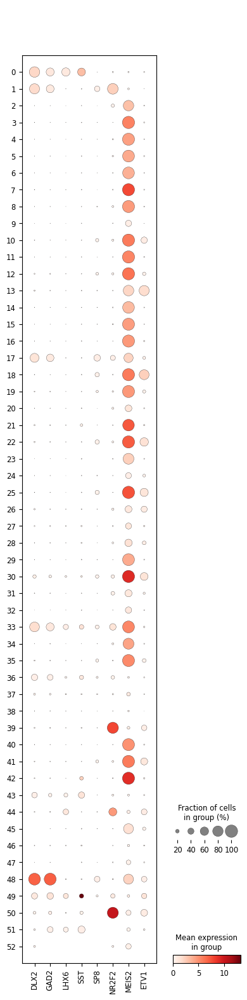

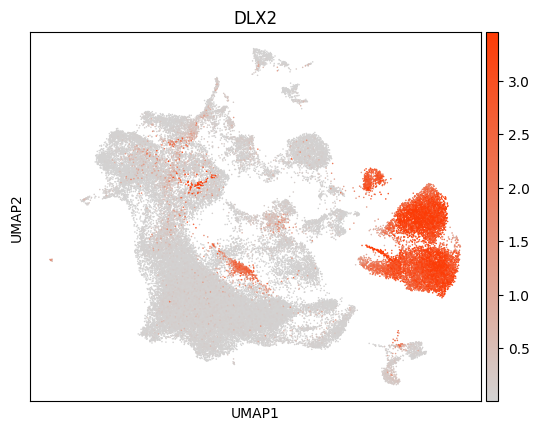

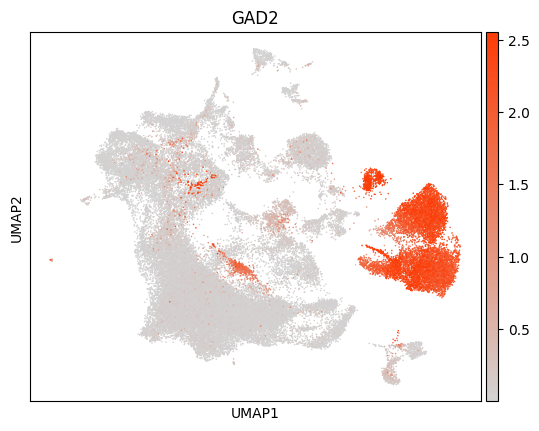

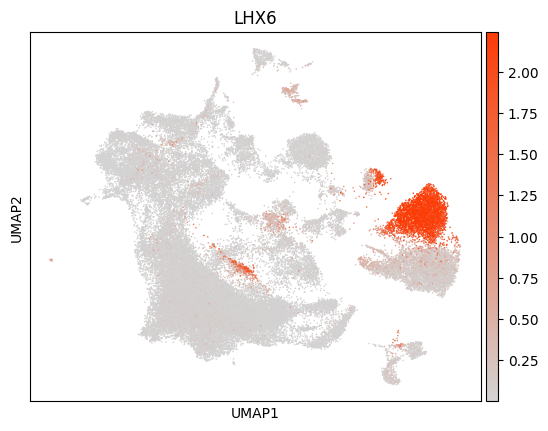

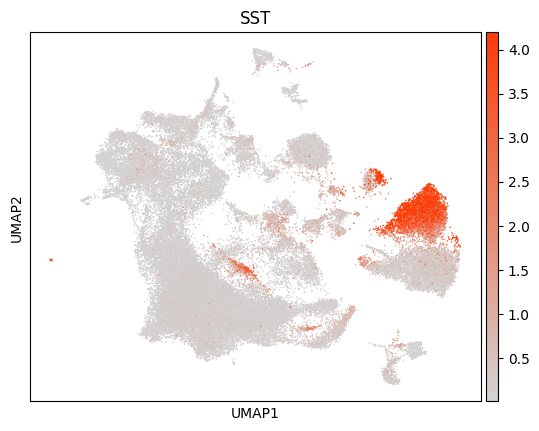

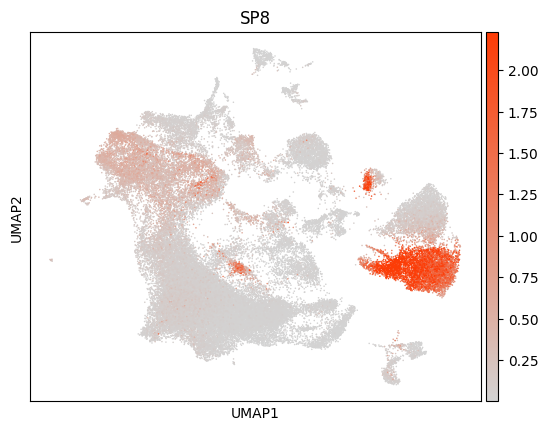

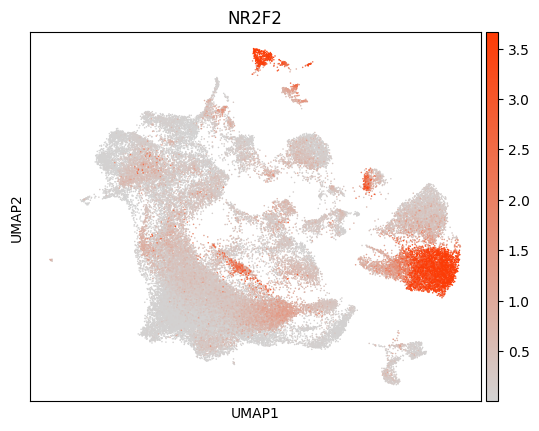

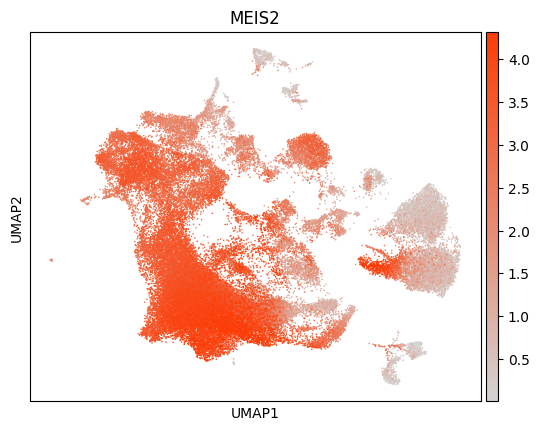

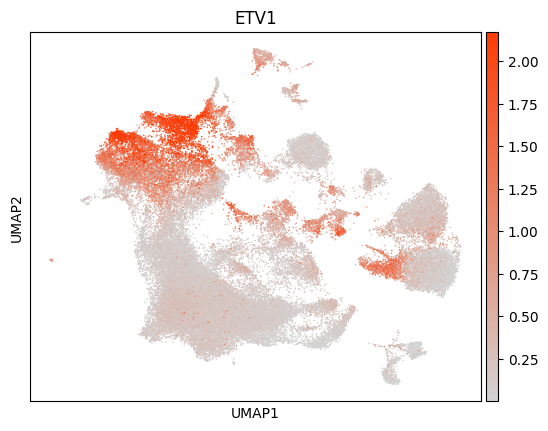

In [12]:
# interneuron (IN: DLX2, GAD2)
## one cluster expressed markers associated with medial ganglionic eminence (MGE: LHX6, SST)
## the other cluster expressed markers associated with both caudal ganglionic eminence and pallial-subpallial boundary (CGE: SP8, NR2F2; PSB: MEIS2, ETV1)

markers = ['DLX2','GAD2',
           'LHX6','SST',
           'SP8','NR2F2','MEIS2','ETV1']
sc.pl.dotplot(adata, markers, groupby='leiden_scvi')
PlotUMAP(adata, markers, layer='log2_counts_scvi', size=5)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Paramete

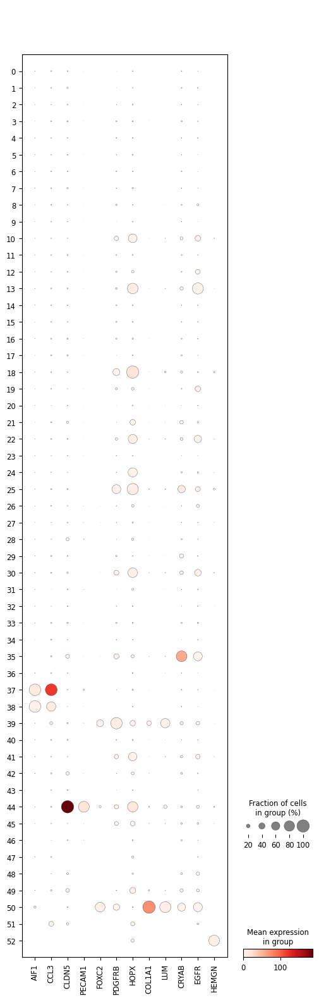

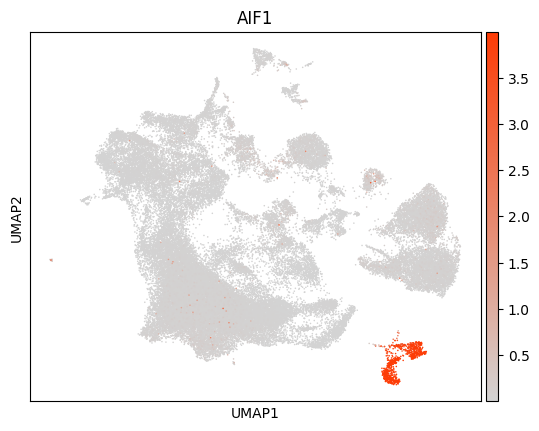

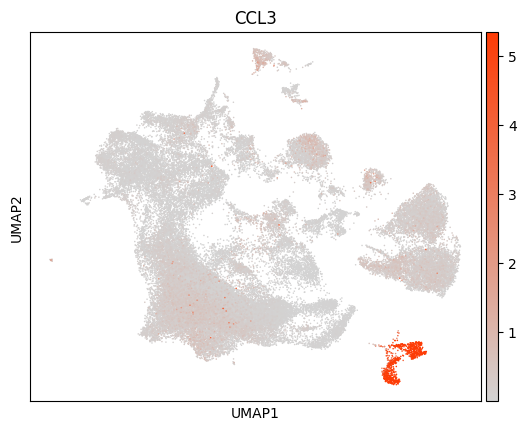

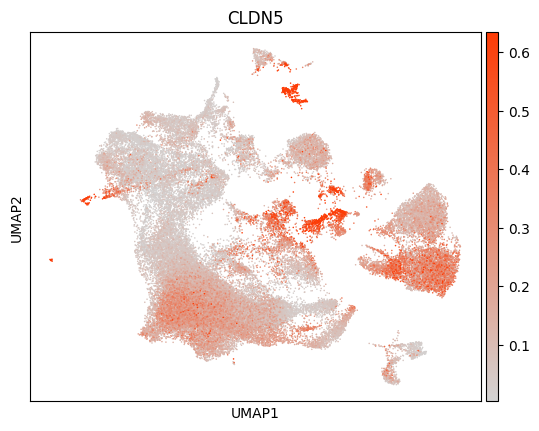

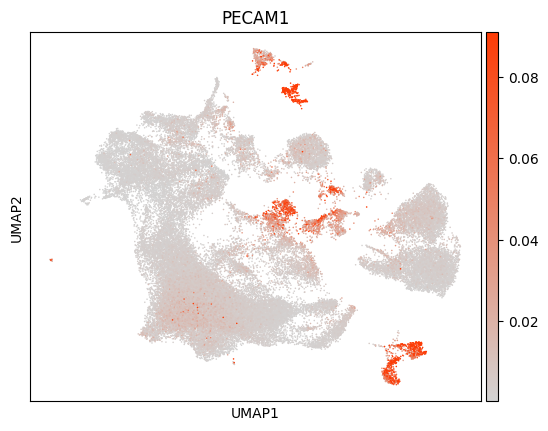

...

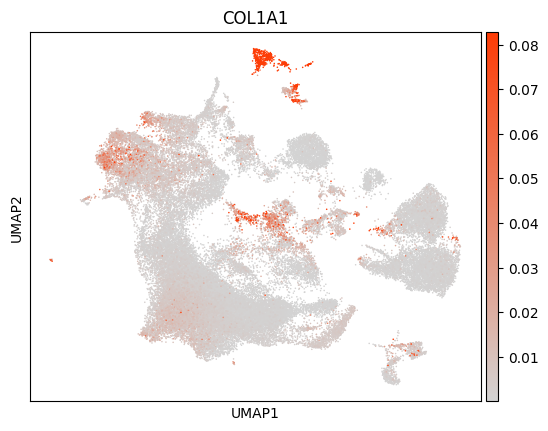

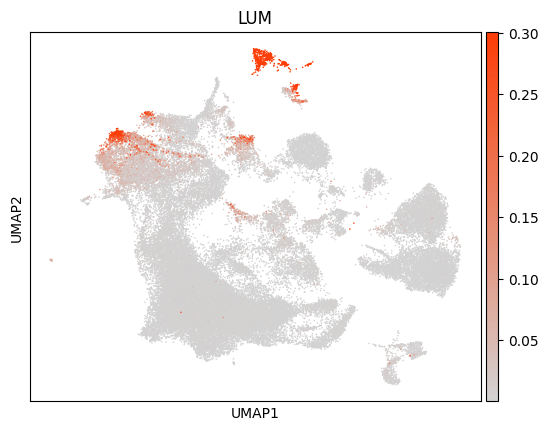

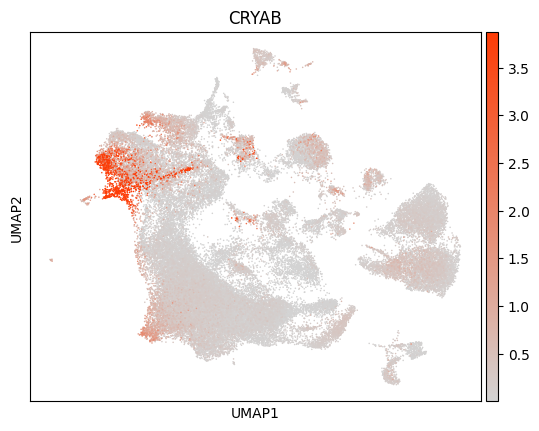

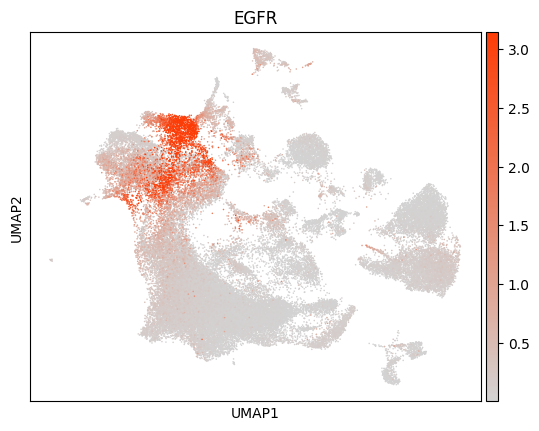

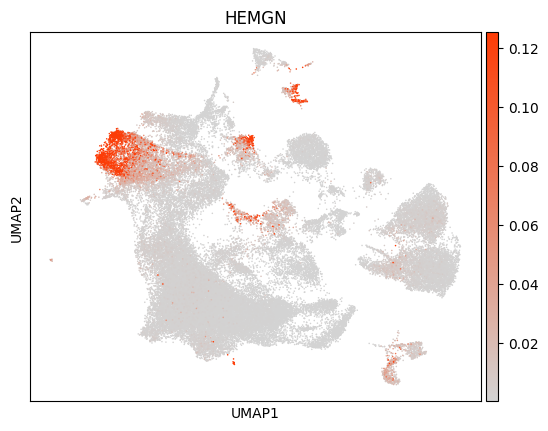

In [13]:
# microglia (MG: AIF1, CCL3)
# endothelial cells (EC: CLDN5, PECAM1)
# pericytes (Peric: FOXC2, PDGFRB, HOPX)
# vascular leptomeningeal cells (VLMC: FOXC2, COL1A1, LUM, CRYAB, EGFR)
# red blood cells (RBC: HEMGN)
markers = ['AIF1','CCL3',
           'CLDN5','PECAM1',
           'FOXC2','PDGFRB','HOPX',
           'COL1A1','LUM','CRYAB','EGFR',
           'HEMGN']
sc.pl.dotplot(adata, markers, groupby='leiden_scvi')
PlotUMAP(adata, markers, layer='log2_counts_scvi', size=5)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


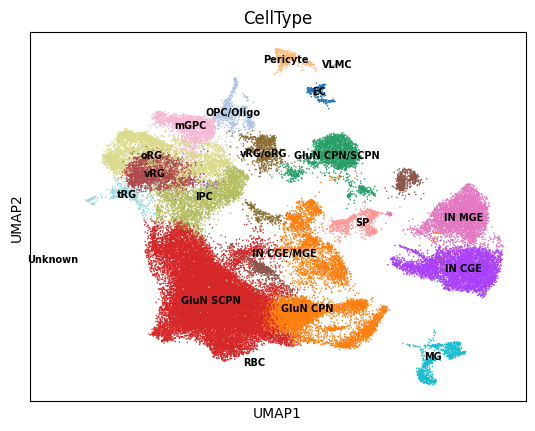

In [14]:
cluster_labels = {'0':'IN MGE',
                  '1':'IN CGE',
                  '2':'GluN CPN',
                  '3':'GluN SCPN',
                  '4':'GluN SCPN',
                  '5':'GluN SCPN',
                  '6':'GluN SCPN',
                  '7':'GluN SCPN',
                  '8':'GluN SCPN',
                  '9':'GluN CPN/SCPN',
                  '10':'vRG',
                  '11':'GluN SCPN',
                  '12':'IPC',
                  '13':'mGPC',
                  '14':'GluN SCPN',
                  '15':'GluN SCPN',
                  '16':'GluN SCPN',
                  '17':'IN CGE',
                  '18':'oRG',
                  '19':'IPC',
                  '20':'GluN CPN',
                  '21':'GluN CPN',
                  '22':'oRG',
                  '23':'GluN SCPN',
                  '24':'vRG/oRG',
                  '25':'oRG',
                  '26':'OPC/Oligo',
                  '27':'GluN CPN',
                  '28':'SP',
                  '29':'GluN SCPN',
                  '30':'oRG',
                  '31':'GluN CPN',
                  '32':'GluN CPN',
                  '33':'IN CGE/MGE',
                  '34':'GluN SCPN',
                  '35':'tRG',
                  '36':'IN CGE/MGE',
                  '37':'MG',
                  '38':'MG',
                  '39':'Pericyte',
                  '40':'GluN SCPN',
                  '41':'vRG',
                  '42':'GluN CPN',
                  '43':'IN MGE',
                  '44':'EC',
                  '45':'vRG/oRG',
                  '46':'GluN CPN/SCPN',
                  '47':'GluN CPN/SCPN',
                  '48':'IN CGE',
                  '49':'IN MGE',
                  '50':'VLMC',
                  '51':'Unknown',
                  '52':'RBC'}
adata.obs['CellType'] = adata.obs['leiden_scvi'].map(cluster_labels)
sc.pl.umap(adata, color=['CellType'], size=5, legend_loc='on data', legend_fontsize=7)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Paramete

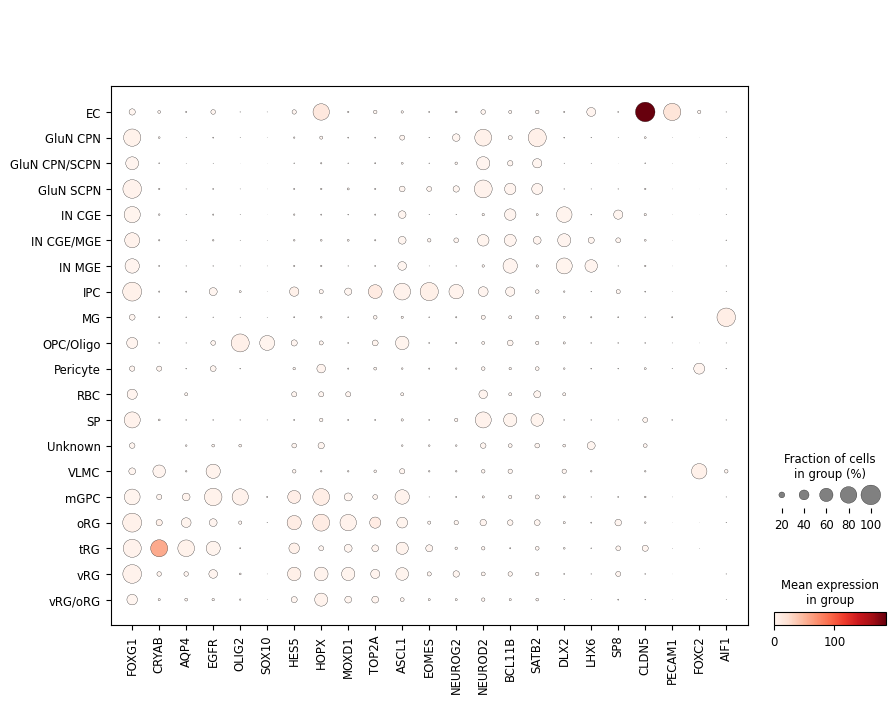

In [15]:
markers = ['FOXG1','CRYAB','AQP4','EGFR',
           'OLIG2','SOX10',
           'HES5','HOPX','MOXD1','TOP2A',
           'ASCL1', 'EOMES', 'NEUROG2', 'NEUROD2','BCL11B','SATB2','DLX2','LHX6','SP8','CLDN5',
           'PECAM1','FOXC2','AIF1']
sc.pl.dotplot(adata, markers, groupby='CellType')